# Next

# Loading Data

In [2]:
# from google.colab import drive
import pandas as pd
# drive.mount('/content/drive')

In [ ]:
file_path = '/kaggle/input/arageneval-train-data/train_data_splitted.csv'

train_data = pd.read_csv(file_path)
display(train_data.head())

In [3]:
file_path = '/kaggle/input/arageneval-train-data/valid_data_cleaned.csv'

valid_data = pd.read_csv(file_path)
display(valid_data.head())

,Unnamed: 0,id,text_in_author_style,author,avg_word_length,text_size,detected_language,cleaned_text
0,0,3835,من طفل في الخمسين\n\nعمري ما احتفلت أو حفلت بع...,يوسف إدريس,4.485623,1747,ar,من طفل في الخمسين\n\nعمري ما احتفلت أو حفلت بع...
1,1,3836,ذلك الزمن العام هو العداد العام الذي\n\nدام يع...,يوسف إدريس,4.578171,1922,ar,ذلك الزمن العام هو العداد العام الذي\n\nدام يع...
2,2,3837,مصر الغنية المثقفة المصنِّعة، والعرب\n\nوقد\n\...,يوسف إدريس,4.816770,1903,ar,مصر الغنية المثقفة المصنعة، والعرب\n\nوقد\n\nأ...
3,3,3838,ولأنها غريبة وراودتني فيها عن الناس وعن الحياة...,يوسف إدريس,4.733333,1747,ar,ولأنها غريبة وراودتني فيها عن الناس وعن الحياة...
4,4,3839,وليس ما ذكرته مرارة ولا ندمًا؛ فقد كان لا يمكن...,يوسف إدريس,4.537367,1580,ar,وليس ما ذكرته مرارة ولا ندما؛ فقد كان لا يمكن ...


# Cleaning

In [4]:
import re
import random
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt') # To include and use word tokenizer
nltk.download('punkt_tab') # Download punkt_tab for Arabic tokenization
nltk.download('stopwords')
stop = set(nltk.corpus.stopwords.words("arabic"))

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /usr/share/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
def normalize_text(text:str):
  # normalize alif
  text = text.replace(u"\u0625", u"\u0627")  # HAMZA below, with LETTER ALEF
  text = text.replace(u"\u0622", u"\u0627")  # ALEF WITH MADDA ABOVE, with LETTER ALEF
  text = text.replace(u"\u0623", u"\u0627")  # ALEF WITH HAMZA ABOVE, with LETTER ALEF

  # check whether text is of type string
  if not isinstance(text, str):
    raise TypeError("TypeError: text must be a string")

  # remove numbers
  text = re.sub(r"\d+", "", text)

  # Remove punctuations
  text = re.sub(r"[^\w\s]", "", text)

  # remove extra spaces
  text = re.sub(r"\s+", " ", text)

  # This part to make sure of good cleaning (may take long execution time)
  words = word_tokenize(text)
  text = [w for w in words if len(w)>1] # remove non words
  text = " ".join([w for w in words if w not in stop]) # remove stop words

  return text.strip()

In [45]:
train_data['normalized_text'] = train_data['cleaned_text'].apply(normalize_text)
train_data.head()

,original_id,text_in_author_style,author,text_size,chunk_index,is_split,cleaned_text,normalized_text
0,5843,"هذه الكتب التي أصدرتُها منذ بدأت كتابة باب ""من...",يوسف إدريس,1921,0,False,"هذه الكتب التي أصدرتها منذ بدأت كتابة باب ""من ...",الكتب اصدرتها بدات كتابة باب مفكرة يوسف ادريس ...
1,5844,صعب جِدًّا في ظل هذا التقسيم الإرهابي أن أقول ...,يوسف إدريس,1616,0,False,صعب جدا في ظل هذا التقسيم الإرهابي أن أقول إن ...,صعب جدا ظل التقسيم الارهابي ان اقول ان نوعا خا...
2,5845,كان ممكنًا أن أتفادى هذا\n\nالموضوع الشائك، وأ...,يوسف إدريس,1913,0,False,كان ممكنا أن أتفادى هذا\n\nالموضوع الشائك، وأذ...,ممكنا ان اتفادى الموضوع الشائك واذهب اتحدث موض...
3,5846,ومن المُمكن للعراق وحده أن يَجتثَّه ويقضي على ...,يوسف إدريس,2047,0,False,ومن الممكن للعراق وحده أن يجتثه ويقضي على الهج...,الممكن للعراق وحده ان يجتثه ويقضي الهجوم اين م...
4,5847,كنتُ أريد أن أتناول موضوعًا من هذه المواضيع.\n...,يوسف إدريس,2022,0,False,كنت أريد أن أتناول موضوعا من هذه المواضيع.\n\n...,كنت اريد ان اتناول موضوعا المواضيع ولكني استطع...


In [6]:
valid_data['normalized_text'] = valid_data['cleaned_text'].apply(normalize_text)
valid_data.head()

,Unnamed: 0,id,text_in_author_style,author,avg_word_length,text_size,detected_language,cleaned_text,normalized_text
0,0,3835,من طفل في الخمسين\n\nعمري ما احتفلت أو حفلت بع...,يوسف إدريس,4.485623,1747,ar,من طفل في الخمسين\n\nعمري ما احتفلت أو حفلت بع...,طفل الخمسين عمري احتفلت او حفلت بعيد ميلادي كن...
1,1,3836,ذلك الزمن العام هو العداد العام الذي\n\nدام يع...,يوسف إدريس,4.578171,1922,ar,ذلك الزمن العام هو العداد العام الذي\n\nدام يع...,الزمن العام العداد العام دام يعد السنين والايا...
2,2,3837,مصر الغنية المثقفة المصنِّعة، والعرب\n\nوقد\n\...,يوسف إدريس,4.816770,1903,ar,مصر الغنية المثقفة المصنعة، والعرب\n\nوقد\n\nأ...,مصر الغنية المثقفة المصنعة والعرب وقد احالوا ب...
3,3,3838,ولأنها غريبة وراودتني فيها عن الناس وعن الحياة...,يوسف إدريس,4.733333,1747,ar,ولأنها غريبة وراودتني فيها عن الناس وعن الحياة...,ولانها غريبة وراودتني الناس وعن الحياة وعن نفس...
4,4,3839,وليس ما ذكرته مرارة ولا ندمًا؛ فقد كان لا يمكن...,يوسف إدريس,4.537367,1580,ar,وليس ما ذكرته مرارة ولا ندما؛ فقد كان لا يمكن ...,وليس ذكرته مرارة ندما فقد يمكن ان يحدث الا حدث...


# Topic Modeling

In [7]:
from sentence_transformers import SentenceTransformer

2025-07-15 13:05:40.224903: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752584740.587560      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752584740.698349      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [8]:
model_id = "Omartificial-Intelligence-Space/GATE-AraBert-v1"
embedding_model = SentenceTransformer(model_id, device="cuda:0")

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/201 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/666 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/541M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/695 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/296 [00:00<?, ?B/s]

## Embed Articles

In [11]:
# import numpy as np
import pickle

In [46]:
articles_embeddings = embedding_model.encode(train_data['normalized_text'].values, show_progress_bar=True, batch_size=64)

print(articles_embeddings.shape)

Batches:   0%|          | 0/515 [00:00<?, ?it/s]

(32941, 768)


In [9]:
valid_articles_embeddings = embedding_model.encode(valid_data['normalized_text'].values, show_progress_bar=True, batch_size=64)

print(valid_articles_embeddings.shape)

Batches:   0%|          | 0/65 [00:00<?, ?it/s]

(4157, 768)


In [47]:
# Store train data embeddings

# as pickle
with open("/kaggle/working/authorship_train_embeddings_GATE-AraBert-v1_v1.pkl", "wb") as fOut:
  pickle.dump({'embeddings': articles_embeddings},
              fOut,
              protocol = pickle.HIGHEST_PROTOCOL)

# or as numpy

# np.save("/kaggle/working/authorship_embeddings_GATE-AraBert-v1.npy", articles_embeddings)

In [13]:
# Store valiadtion data embeddings

# as pickle
with open("/kaggle/working/authorship_valid_embeddings_GATE-AraBert-v1_v0.pkl", "wb") as fOut:
  pickle.dump({'embeddings': valid_articles_embeddings},
              fOut,
              protocol = pickle.HIGHEST_PROTOCOL)

# or as numpy

# np.save("/kaggle/working/authorship_embeddings_GATE-AraBert-v1.npy", articles_embeddings)

## Load embeddings

In [ ]:
# Load data and embeddings

# as pickle
with open("/kaggle/input/authorship-embeddings/authorship_embeddings_GATE-AraBert-v1_v1.pkl", 'rb') as fIn:
  articles_embeddings = pickle.load(fIn)['embeddings']

# or as numpy
# with open("/kaggle/working/authorship_embeddings_GATE-AraBert-v1.npy", 'rb') as fIn:
#   articles_embeddings = pickle.load(fIn)['embeddings']

In [ ]:
articles_embeddings.shape

## UMAP Dimensionality Reduction

In [49]:
from umap import UMAP
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import numpy as np
from tqdm.auto import tqdm
import plotly.express as px

In [56]:
# Get list of unique authors
authors = sorted(train_data['author'].unique())

# Map each author to a hex color
palette = plt.get_cmap("tab20")
c_map = {author: mcolors.to_hex(palette(i % 20)) for i, author in enumerate(authors)}

# Apply the color map to the dataset
colors = train_data['author'].map(c_map)
len(colors)

32941

- Higher n_neighbors maintains more of the global structure.

  0%|          | 0/6 [00:00<?, ?it/s]

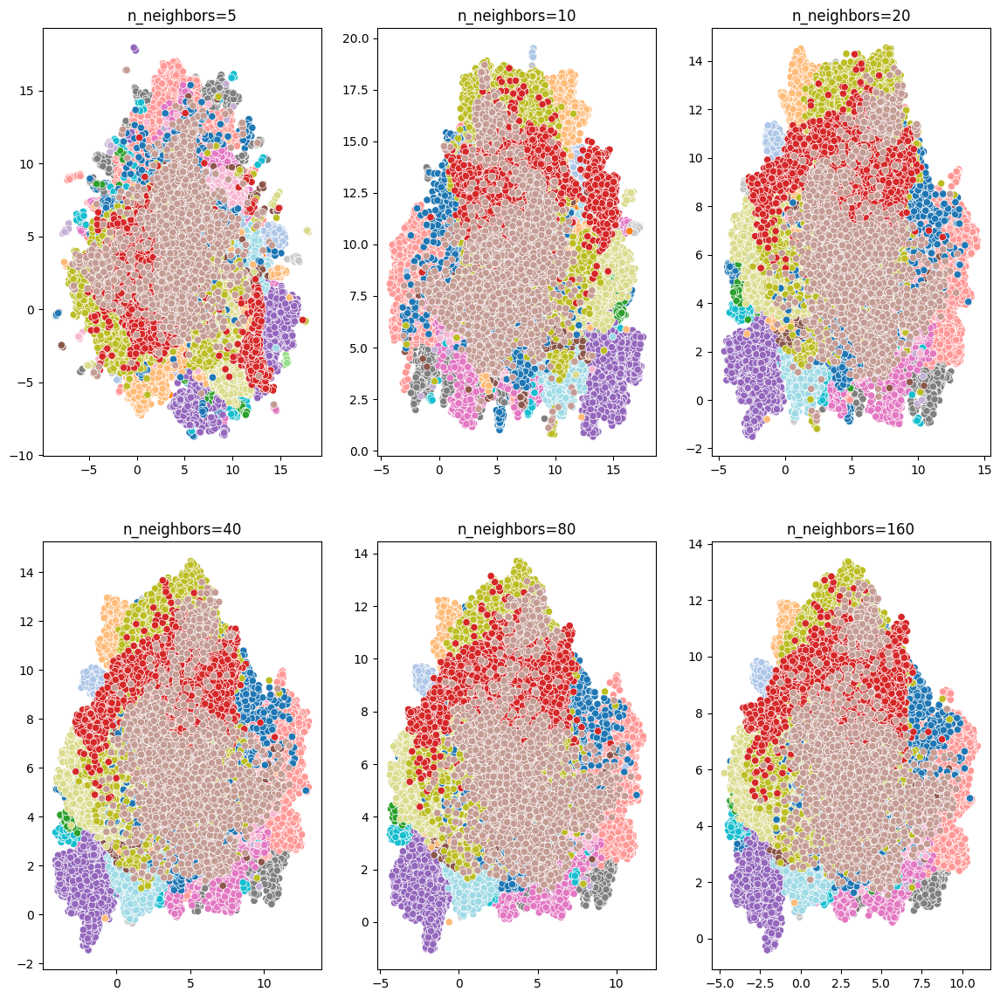

In [105]:
# Trying different n_neighbors

fig, ax = plt.subplots(2, 3, figsize=(14, 14))
nns = [5, 10, 20, 40, 80, 160]
i, j = 0, 0
for n_neighbors in tqdm(nns):
    model = UMAP(n_neighbors=n_neighbors, min_dist = 0.9, metric = "cosine")
    umap = model.fit_transform(articles_embeddings)
    sns.scatterplot(x=umap[:,0], y=umap[:,1], c=colors, ax=ax[j, i])
    ax[j, i].set_title(f'n_neighbors={n_neighbors}')
    if i < 2: i += 1
    else: i = 0; j += 1

- min_dist controls how tightly UMAP packs points together in the low-dimensional space.

- Smaller values (e.g., 0.0–0.1):

    - Preserve local structure.
    
    - Produce tighter, more compact clusters.
    
    - May cause more fragmentation or overfitting to noise.

- Larger values (e.g., 0.5–0.99):

    - Focus more on global structure.
    
    - Produce smoother layouts, but may blur local details.

  0%|          | 0/6 [00:00<?, ?it/s]

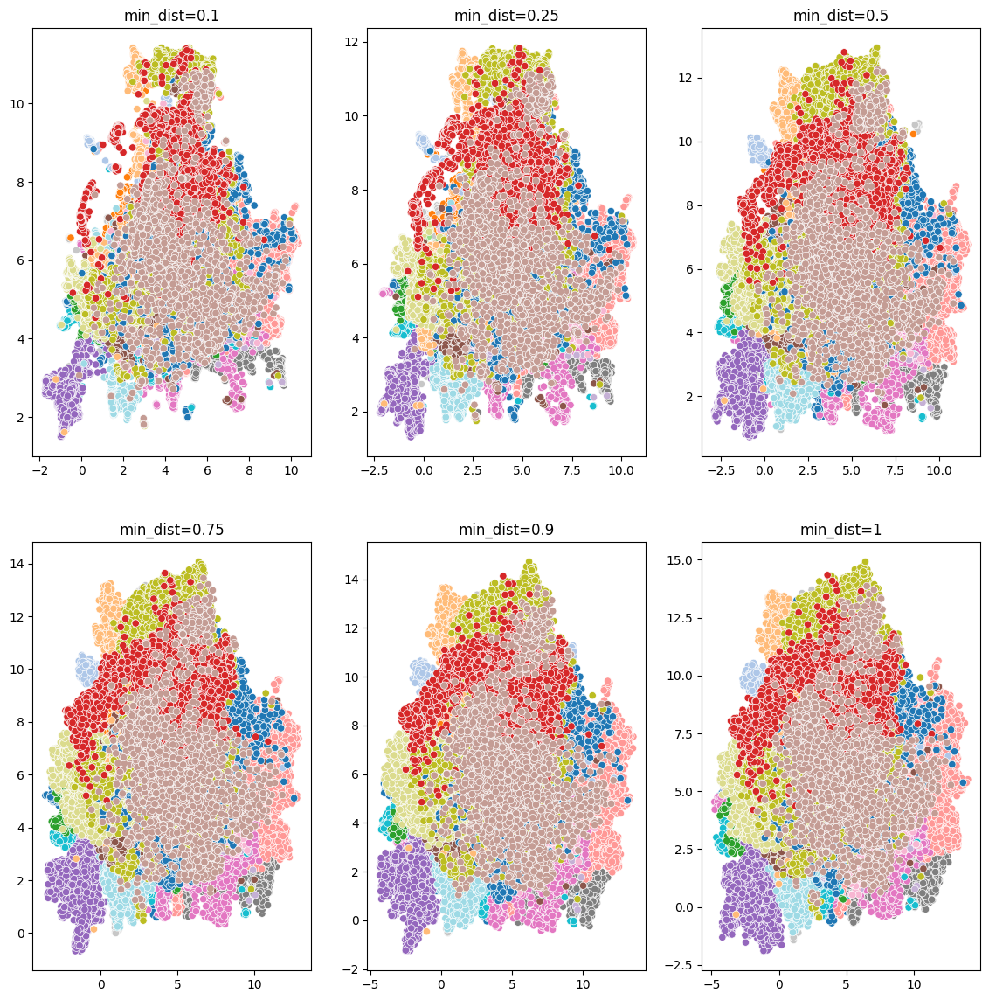

In [106]:
# Trying different min_dist

fig, ax = plt.subplots(2, 3, figsize=(14, 14))
dists = [0.1, 0.25, 0.5, 0.75, 0.9, 1]
i, j = 0, 0
for dist in tqdm(dists):
    model = UMAP(n_neighbors=30, min_dist = dist, metric = "cosine")
    umap = model.fit_transform(articles_embeddings)
    sns.scatterplot(x=umap[:,0], y=umap[:,1], c=colors, ax=ax[j, i])
    ax[j, i].set_title(f'min_dist={dist}')
    if i < 2: i += 1
    else: i = 0; j += 1

In [107]:
umap_model_3d = UMAP(
    n_neighbors = 30,
    n_components = 3,
    min_dist = 0.5,
    metric = "cosine",
    random_state = 5
)

umap_fitted_3d = umap_model_3d.fit_transform(articles_embeddings)

palette = list(c_map.values())

fig = px.scatter_3d(
    x=umap_fitted_3d[:,0], y=umap_fitted_3d[:,1], z=umap_fitted_3d[:,2],
    color=train_data['author'],
    custom_data=[train_data['author'], train_data['original_id']],
    color_discrete_sequence=palette
)
fig.update_traces(
    hovertemplate="<br>".join([
        "sub: %{customdata[1]}",
        "title: %{customdata[0]}"
    ])
)

In [ ]:
# Save the plot
# fig.write_html("umap-topics-3d-color.html", include_plotlyjs="cdn", full_html=False)

In [50]:
# Final hyperparameters choices
umap_model = UMAP(
    n_neighbors = 30,
    n_components = 50,
    min_dist = 0.5,
    metric = "cosine",
    random_state = 5
)

umap_fitted = umap_model.fit_transform(articles_embeddings)

## HDBSCAN Clustering


In [55]:
from hdbscan import HDBSCAN

cluster_size=400 | min_samples=30
Cluster labels = 5


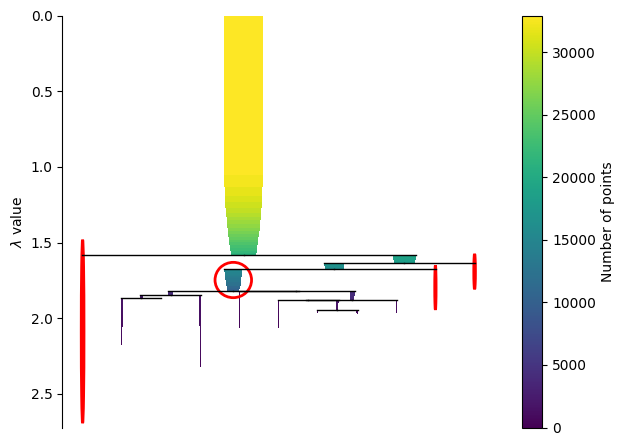

cluster_size=400 | min_samples=33
Cluster labels = 8


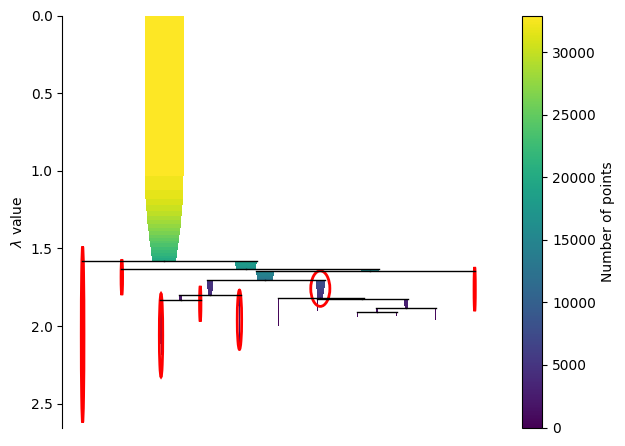

cluster_size=425 | min_samples=30
Cluster labels = 5


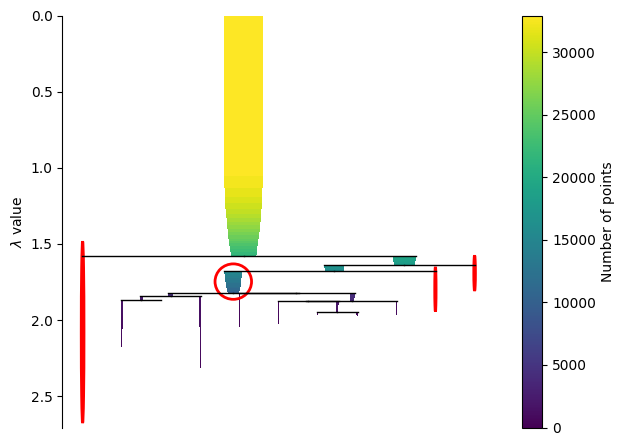

cluster_size=425 | min_samples=33
Cluster labels = 8


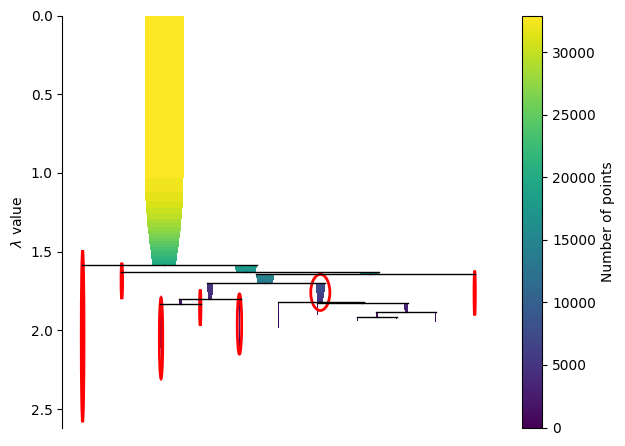

cluster_size=450 | min_samples=30
Cluster labels = 5


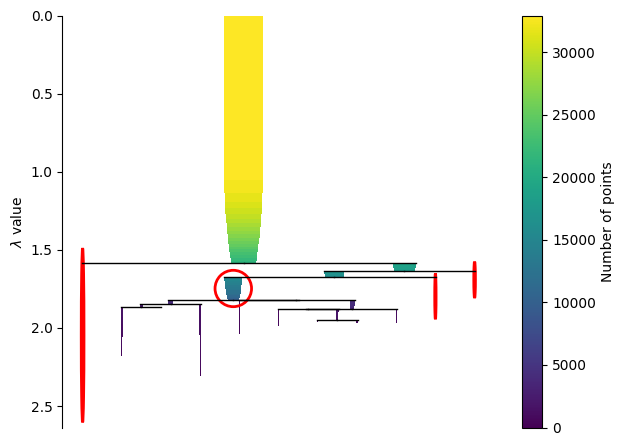

cluster_size=450 | min_samples=33
Cluster labels = 8


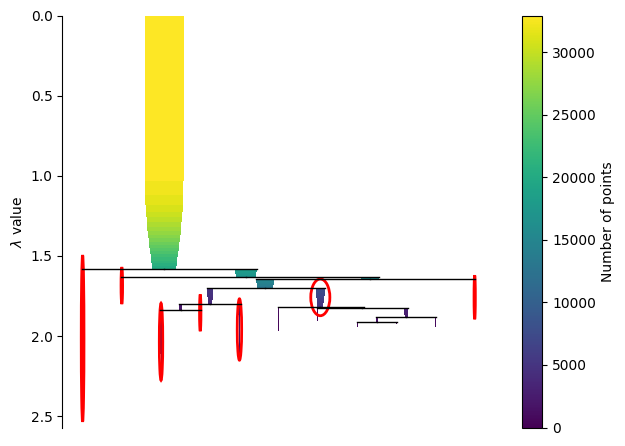

cluster_size=475 | min_samples=30
Cluster labels = 5


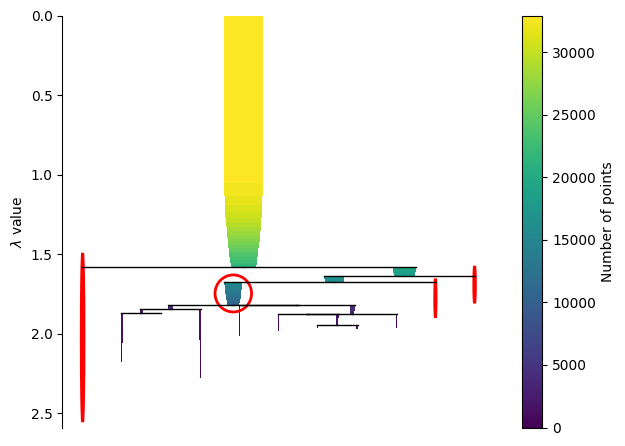

cluster_size=475 | min_samples=33
Cluster labels = 8


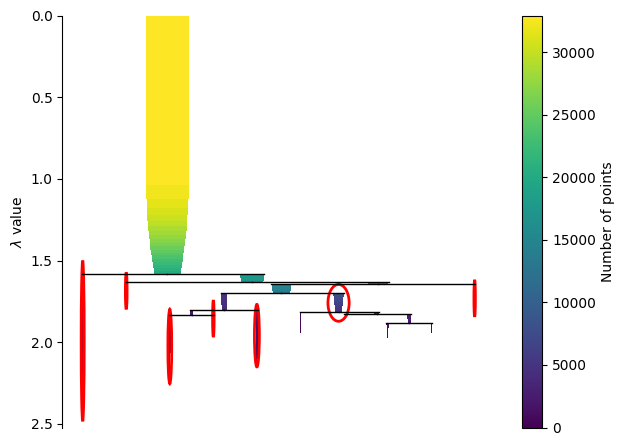

cluster_size=500 | min_samples=30
Cluster labels = 5


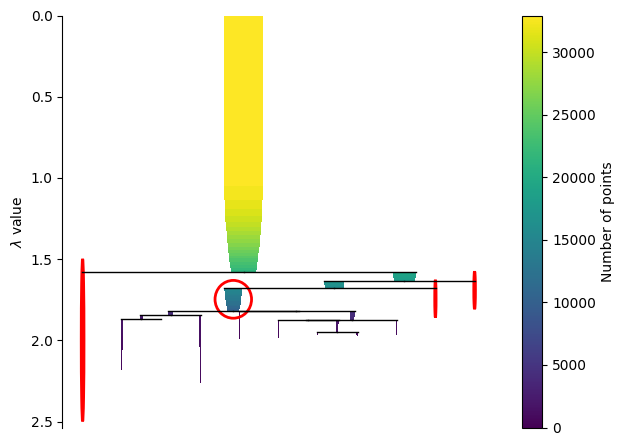

cluster_size=500 | min_samples=33
Cluster labels = 8


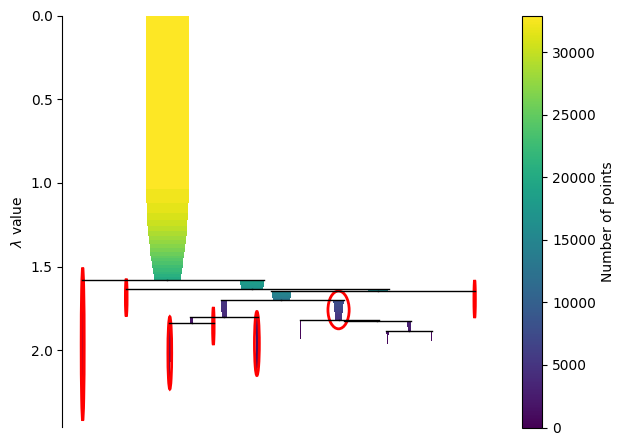

'\n- A high min_cluster_size will generate fewer topics\n- A low min_cluster_size will generate more topics\n- Prediction_data=True -> allows for predicting the cluster membership of new data points based on the trained model\n- HDBSCAN can be used to tune outliers\n'

In [157]:
cluster_sizes = [400, 425, 450, 475, 500]
samples = [30, 33]

for cluster_size in cluster_sizes:
    for n in samples:
        # Clustering
        clusterer = HDBSCAN(
            min_cluster_size = cluster_size,
            min_samples = n,
            metric = "euclidean",
            cluster_selection_method = "eom",
            gen_min_span_tree=True,
            prediction_data = True
        )
        clusterer.fit(umap_fitted)

        # Plot each tree in its own figure
        print(f"cluster_size={cluster_size} | min_samples={n}")
        print(f"Cluster labels = {len(set(clusterer.labels_))}")
        fig = clusterer.condensed_tree_.plot(select_clusters=True)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

        
"""
- A high min_cluster_size will generate fewer topics
- A low min_cluster_size will generate more topics
- Prediction_data=True -> allows for predicting the cluster membership of new data points based on the trained model
- HDBSCAN can be used to tune outliers
"""

In [57]:
# Final hyperparameters choices 
clusterer = HDBSCAN(
        min_cluster_size = 500,
        min_samples = 33,
        metric = "euclidean",
        cluster_selection_method = "eom",
        gen_min_span_tree=True,
        prediction_data = True
    )

clusterer.fit(umap_fitted)

palette = list(c_map.values())

colors = ["Cluster "+str(label) for label in clusterer.labels_]

fig = px.scatter_3d(
    x=umap_fitted[:,0], y=umap_fitted[:,1], z=umap_fitted[:,2],
    color=colors,
    custom_data=[train_data['author'], train_data['original_id']],
    color_discrete_sequence=palette
)
fig.update_traces(
    hovertemplate="<br>".join([
        "sub: %{customdata[1]}",
        "title: %{customdata[0]}"
    ])
)

In [58]:
train_data['cluster'] = clusterer.labels_
train_data.head()

,original_id,text_in_author_style,author,text_size,chunk_index,is_split,cleaned_text,normalized_text,cluster
0,5843,"هذه الكتب التي أصدرتُها منذ بدأت كتابة باب ""من...",يوسف إدريس,1921,0,False,"هذه الكتب التي أصدرتها منذ بدأت كتابة باب ""من ...",الكتب اصدرتها بدات كتابة باب مفكرة يوسف ادريس ...,3
1,5844,صعب جِدًّا في ظل هذا التقسيم الإرهابي أن أقول ...,يوسف إدريس,1616,0,False,صعب جدا في ظل هذا التقسيم الإرهابي أن أقول إن ...,صعب جدا ظل التقسيم الارهابي ان اقول ان نوعا خا...,3
2,5845,كان ممكنًا أن أتفادى هذا\n\nالموضوع الشائك، وأ...,يوسف إدريس,1913,0,False,كان ممكنا أن أتفادى هذا\n\nالموضوع الشائك، وأذ...,ممكنا ان اتفادى الموضوع الشائك واذهب اتحدث موض...,3
3,5846,ومن المُمكن للعراق وحده أن يَجتثَّه ويقضي على ...,يوسف إدريس,2047,0,False,ومن الممكن للعراق وحده أن يجتثه ويقضي على الهج...,الممكن للعراق وحده ان يجتثه ويقضي الهجوم اين م...,3
4,5847,كنتُ أريد أن أتناول موضوعًا من هذه المواضيع.\n...,يوسف إدريس,2022,0,False,كنت أريد أن أتناول موضوعا من هذه المواضيع.\n\n...,كنت اريد ان اتناول موضوعا المواضيع ولكني استطع...,3


In [59]:
train_data['cluster'].value_counts()

cluster
-1    18676
 3     8027
 4     1857
 5     1446
 0     1151
 1      651
 6      589
 2      544
Name: count, dtype: int64

## Vectorizer

In [62]:
!pip install -qU Arabic-Stopwords==0.4.3

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 360.5/360.5 kB 7.0 MB/s eta 0:00:00a 0:00:01


In [65]:
from sklearn.feature_extraction.text import CountVectorizer
import arabicstopwords.arabicstopwords as stp

In [66]:
stopwords_ar = list(set(stp.stopwords_list()))
print(len(stopwords_ar))

stopwords_ar.extend(set(map(normalize_text, stp.stopwords_list())))
print(len(stopwords_ar))

stopwords_ar = list(set(stopwords_ar))
print(len(stopwords_ar))

13465
26517
19363


In [67]:
# Vectorizer
vectorizer_model = CountVectorizer(min_df = 5,
                                   stop_words = stopwords_ar,
                                   analyzer = 'word',
                                   max_df = 750,
                                   ngram_range = (1, 3)
                                   )
"""
- min_df to ignore words that appeared in 5 documents or less as they might be noise
- max_df to ignore words that appeared in 2.5% of the documents or more (treated as stop words)
"""

'\n- min_df to ignore words that appeared in 5 documents or less as they might be noise\n- max_df to ignore words that appeared in 2.5% of the documents or more (treated as stop words)\n'

## BERTopic

In [14]:
!pip install -qU bertopic==0.16.0

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.1/154.1 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 96.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 76.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 2.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 78.3 MB/s eta 0:00:00:00:0100:01


In [16]:
from bertopic.representation import KeyBERTInspired
from bertopic import BERTopic

In [70]:
# Topic Representer
topicRep_model = {"KeyBERT": KeyBERTInspired(top_n_words=50)}

In [71]:
topic_model = BERTopic(
    language = 'arabic',
    calculate_probabilities = True,
    verbose = True, # Info about and while training
    
    # Pipeline models
    embedding_model = embedding_model,
    umap_model = umap_model,
    hdbscan_model = clusterer,
    vectorizer_model = vectorizer_model,
    representation_model = topicRep_model,
    
    # Hyperparameters
    top_n_words = 50 # For each topic, the top 30 most representative words will be selected
)

In [19]:
# Load saved model
topic_model = BERTopic.load("/kaggle/input/topic-model/other/default/1", embedding_model=embedding_model)

2025-07-15 13:23:56,769 - BERTopic - WARNING: You are loading a BERTopic model without explicitly defining an embedding model.If you want to also load in an embedding model, make sure to useBERTopic.load(my_model, embedding_model=my_embedding_model).


## Training

In [72]:
topics, probs = topic_model.fit_transform(
    train_data['normalized_text'],
    articles_embeddings
)

2025-07-11 00:52:54,482 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-07-11 00:54:24,599 - BERTopic - Dimensionality - Completed ✓
2025-07-11 00:54:24,615 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-07-11 00:54:49,552 - BERTopic - Cluster - Completed ✓
2025-07-11 00:54:49,562 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-07-11 00:55:43,138 - BERTopic - Representation - Completed ✓


In [73]:
# Save the model
topic_model.save("/kaggle/working",
                 serialization="safetensors",
                 save_ctfidf=True
                 )

## Inference

In [74]:
# Generate labels
topic_labels = topic_model.generate_topic_labels(nr_words=50, topic_prefix=False, word_length=15, separator='-')
topic_model.set_topic_labels(topic_labels)

In [75]:
topic_labels

['الله-كانت-الناس-قال-يكون-الحياة-شيء-الانسان-العرب-سنة-العالم-يكن-مصر-العلم-احد-عبد-اخر-الارض-اهل-يقول-اليوم-اخرى-الدين-الاسلام-فقال-شيئا-العربية-كنت-تكون-يوم-كانوا-الكتاب-الامر-وكانت-محمد-يمكن-الرجل-الاول-العقل-وقال-الدولة-كتاب-الملك-الحديث-الاولى-التاريخ-واحدة-العصر-المراة-القران',
 'الله-كانت-العلم-يكون-الانسان-سنة-شيء-العقل-العالم-الدين-يمكن-اخرى-تكون-اخر-فقال-كتاب-يكن-الفعل-الحياة-العربية-الناس-المراة-الوجود-الاول-عبد-الحديث-قال-يقول-الرجل-احد-مصر-الفلسفة-التاريخ-محمد-وقال-شيئا-الامر-الطبيعة-الكتاب-النظر-نظرية-الاولى-تاريخ-وجود-اللغة-الفكر-العلوم-اثبات-الادب-الذات',
 'الشعر-يضرب-الشاعر-الشعراء-الناس-قال-شعر-والمراد-جمع-القصيدة-شيء-الله-يكون-العرب-يقول-وانظر-بني-فقال-شعره-عبد-معناه-اخر-قولهم-قصيدة-اهل-كانت-البيت-سنة-الرومي-قول-الخ-شاعر-العصر-الادب-يكن-الاول-الحديث-قوله-معنى-وقال-شيئا-كانوا-شعراء-يريدون-امية-الشيء-المعنى-الملك-بكسر-وصف',
 'الله-عمر-المسلمين-بكر-مكة-قريش-المدينة-محمد-رسول-النبي-رسول الله-الناس-قال-خالد-اهل-المسلمون-العرب-عبد-الروم-المسجد-عمرو-بني-كانت-الاسلام-امر-ال

In [76]:
topic_info = topic_model.get_topic_info()
topic_info

,Topic,Count,Name,CustomName,Representation,KeyBERT,Representative_Docs
0,-1,18676,-1_الله_كانت_الناس_قال,الله-كانت-الناس-قال-يكون-الحياة-شيء-الانسان-ال...,"[الله, كانت, الناس, قال, يكون, الحياة, شيء, ال...","[الادب, الاسلامية, الاسلام, الدين, الشيخ, المس...",[ويظهر ان الاخبار وامثالها لونت حياة المسلمين ...
1,0,8027,0_الله_كانت_العلم_يكون,الله-كانت-العلم-يكون-الانسان-سنة-شيء-العقل-الع...,"[الله, كانت, العلم, يكون, الانسان, سنة, شيء, ا...","[الادب, العقل, فلسفة, الدين, الانسانية, الوجود...",[يعني خلق الانسان وخلق العقل اي نفي للصفات الم...
2,1,1857,1_الشعر_يضرب_الشاعر_الشعراء,الشعر-يضرب-الشاعر-الشعراء-الناس-قال-شعر-والمرا...,"[الشعر, يضرب, الشاعر, الشعراء, الناس, قال, شعر...","[الشعراء, شعراء, شاعر, الشاعر, القصيدة, شعرا, ...",[ونقد الشعر معناه قديم تاريخ الادب يتصل بصدر ا...
3,2,1446,2_الله_عمر_المسلمين_بكر,الله-عمر-المسلمين-بكر-مكة-قريش-المدينة-محمد-رس...,"[الله, عمر, المسلمين, بكر, مكة, قريش, المدينة,...","[رسول الله, الرسول, النبي, قريش, الانصار, للمس...",[نعرض لمثل نقد الشيعة الامامية لابي بكر فقد نق...
4,3,1151,3_قال_انني_رئيس_الامر,قال-انني-رئيس-الامر-كنت-كانت-اعتقد-السفينة-شيء...,"[قال, انني, رئيس, الامر, كنت, كانت, اعتقد, الس...","[جون, اللورد, افضل, كنت, لندن, يجب, سيكون, بال...",[الافضل ان تعي البداية يشكل اي مشكلة الا ترى ا...
5,4,651,4_الهند_المغرب_الاندلس_العرب,الهند-المغرب-الاندلس-العرب-المباني-سنة-القرن-ا...,"[الهند, المغرب, الاندلس, العرب, المباني, سنة, ...","[الهند, المعابد, قرون, العمارة, القديمة, الطرا...",[اهداء الكتاب الى النائب ووزير الاشغال العامة ...
6,5,589,5_مصر_باشا_سنة_شفيق,مصر-باشا-سنة-شفيق-القاهرة-الدين-الباشا-السلطان...,"[مصر, باشا, سنة, شفيق, القاهرة, الدين, الباشا,...","[الخديوي, صلاح الدين, الباشا, فبعث, السلطان, ب...",[وفي سنة خلفه ابراهيم باشا فاخذ يستطلع ويتحرى ...
7,6,544,6_سير_سيدي_كنت_مولاي,سير-سيدي-كنت-مولاي-المسرحية-انني-يدخل-شكسبير-ا...,"[سير, سيدي, كنت, مولاي, المسرحية, انني, يدخل, ...","[البندقية, شكسبير, النقاد, الامير, حبي, القصة,...",[وهل تراك ترجو ان تنال شيئا امنعه فكل تطلبه اج...


In [96]:
topic_info['KeyBERT'][7]

['البندقية',
 'شكسبير',
 'النقاد',
 'الامير',
 'حبي',
 'القصة',
 'القس',
 'مولاي',
 'ابنة',
 'سيدي',
 'اريد',
 'تريد',
 'الملك',
 'قلبي',
 'الكونت',
 'المسرحية',
 'مسرحية',
 'اشد',
 'ابنتي',
 'جون',
 'اخرى',
 'حب',
 'الحب',
 'المنزل',
 'الباني',
 'ارجو',
 'الاصل',
 'احد',
 'الحياة',
 'الخادم',
 'الفصل',
 'ترى',
 'سيدتي',
 'انظر',
 'السير',
 'الصورة',
 'اخر',
 'كانت',
 'يكن',
 'يقول',
 'الماساة',
 'وداعا',
 'الليلة',
 'يخرج',
 'كنت',
 'زوجة',
 'ويقول',
 'سير',
 'تكون',
 'يدخل']

In [104]:
train_data['topic'] = topics
# train_data['prob'] = probs

train_data.head()

,original_id,text_in_author_style,author,text_size,chunk_index,is_split,cleaned_text,normalized_text,cluster,topic
0,5843,"هذه الكتب التي أصدرتُها منذ بدأت كتابة باب ""من...",يوسف إدريس,1921,0,False,"هذه الكتب التي أصدرتها منذ بدأت كتابة باب ""من ...",الكتب اصدرتها بدات كتابة باب مفكرة يوسف ادريس ...,3,0
1,5844,صعب جِدًّا في ظل هذا التقسيم الإرهابي أن أقول ...,يوسف إدريس,1616,0,False,صعب جدا في ظل هذا التقسيم الإرهابي أن أقول إن ...,صعب جدا ظل التقسيم الارهابي ان اقول ان نوعا خا...,3,0
2,5845,كان ممكنًا أن أتفادى هذا\n\nالموضوع الشائك، وأ...,يوسف إدريس,1913,0,False,كان ممكنا أن أتفادى هذا\n\nالموضوع الشائك، وأذ...,ممكنا ان اتفادى الموضوع الشائك واذهب اتحدث موض...,3,0
3,5846,ومن المُمكن للعراق وحده أن يَجتثَّه ويقضي على ...,يوسف إدريس,2047,0,False,ومن الممكن للعراق وحده أن يجتثه ويقضي على الهج...,الممكن للعراق وحده ان يجتثه ويقضي الهجوم اين م...,3,0
4,5847,كنتُ أريد أن أتناول موضوعًا من هذه المواضيع.\n...,يوسف إدريس,2022,0,False,كنت أريد أن أتناول موضوعا من هذه المواضيع.\n\n...,كنت اريد ان اتناول موضوعا المواضيع ولكني استطع...,3,0


In [105]:
train_data['topic'].value_counts()

topic
-1    18676
 0     8027
 1     1857
 2     1446
 3     1151
 4      651
 5      589
 6      544
Name: count, dtype: int64

In [109]:
train_data.drop(['cluster'], axis=1, inplace=True)
train_data.head()

,original_id,text_in_author_style,author,text_size,chunk_index,is_split,cleaned_text,normalized_text,topic
0,5843,"هذه الكتب التي أصدرتُها منذ بدأت كتابة باب ""من...",يوسف إدريس,1921,0,False,"هذه الكتب التي أصدرتها منذ بدأت كتابة باب ""من ...",الكتب اصدرتها بدات كتابة باب مفكرة يوسف ادريس ...,0
1,5844,صعب جِدًّا في ظل هذا التقسيم الإرهابي أن أقول ...,يوسف إدريس,1616,0,False,صعب جدا في ظل هذا التقسيم الإرهابي أن أقول إن ...,صعب جدا ظل التقسيم الارهابي ان اقول ان نوعا خا...,0
2,5845,كان ممكنًا أن أتفادى هذا\n\nالموضوع الشائك، وأ...,يوسف إدريس,1913,0,False,كان ممكنا أن أتفادى هذا\n\nالموضوع الشائك، وأذ...,ممكنا ان اتفادى الموضوع الشائك واذهب اتحدث موض...,0
3,5846,ومن المُمكن للعراق وحده أن يَجتثَّه ويقضي على ...,يوسف إدريس,2047,0,False,ومن الممكن للعراق وحده أن يجتثه ويقضي على الهج...,الممكن للعراق وحده ان يجتثه ويقضي الهجوم اين م...,0
4,5847,كنتُ أريد أن أتناول موضوعًا من هذه المواضيع.\n...,يوسف إدريس,2022,0,False,كنت أريد أن أتناول موضوعا من هذه المواضيع.\n\n...,كنت اريد ان اتناول موضوعا المواضيع ولكني استطع...,0


In [110]:
def get_topic_name(topic:int):
  return topic_model.get_topic_info(topic)['KeyBERT']

In [111]:
train_data['topic_keywords'] = train_data['topic'].apply(get_topic_name)
train_data.head()

,original_id,text_in_author_style,author,text_size,chunk_index,is_split,cleaned_text,normalized_text,topic,topic_keywords
0,5843,"هذه الكتب التي أصدرتُها منذ بدأت كتابة باب ""من...",يوسف إدريس,1921,0,False,"هذه الكتب التي أصدرتها منذ بدأت كتابة باب ""من ...",الكتب اصدرتها بدات كتابة باب مفكرة يوسف ادريس ...,0,"[الادب, العقل, فلسفة, الدين, الانسانية, الوجود..."
1,5844,صعب جِدًّا في ظل هذا التقسيم الإرهابي أن أقول ...,يوسف إدريس,1616,0,False,صعب جدا في ظل هذا التقسيم الإرهابي أن أقول إن ...,صعب جدا ظل التقسيم الارهابي ان اقول ان نوعا خا...,0,"[الادب, العقل, فلسفة, الدين, الانسانية, الوجود..."
2,5845,كان ممكنًا أن أتفادى هذا\n\nالموضوع الشائك، وأ...,يوسف إدريس,1913,0,False,كان ممكنا أن أتفادى هذا\n\nالموضوع الشائك، وأذ...,ممكنا ان اتفادى الموضوع الشائك واذهب اتحدث موض...,0,"[الادب, العقل, فلسفة, الدين, الانسانية, الوجود..."
3,5846,ومن المُمكن للعراق وحده أن يَجتثَّه ويقضي على ...,يوسف إدريس,2047,0,False,ومن الممكن للعراق وحده أن يجتثه ويقضي على الهج...,الممكن للعراق وحده ان يجتثه ويقضي الهجوم اين م...,0,"[الادب, العقل, فلسفة, الدين, الانسانية, الوجود..."
4,5847,كنتُ أريد أن أتناول موضوعًا من هذه المواضيع.\n...,يوسف إدريس,2022,0,False,كنت أريد أن أتناول موضوعا من هذه المواضيع.\n\n...,كنت اريد ان اتناول موضوعا المواضيع ولكني استطع...,0,"[الادب, العقل, فلسفة, الدين, الانسانية, الوجود..."


In [112]:
train_data.to_csv('train_data_splitted_topics.csv', index=False)

In [ ]:
# Plot distribution of probs
# plt.figure(figsize=(8,5))
# sns.histplot(train_data['prob'], bins=25, kde=True)
# plt.axvline(train_data['prob'].mean(), color='r', linestyle='dashed', linewidth=2, label="Mean")
# plt.title("Probability Distribution of Topic Modeling")

## Visualizations

In [113]:
topic_model.visualize_topics()

In [115]:
reduced_embeddings = UMAP(n_neighbors=30, n_components=2, min_dist=0.5, metric='cosine').fit_transform(articles_embeddings)
topic_model.visualize_documents(train_data['author'], reduced_embeddings=reduced_embeddings)

In [116]:
topic_model.visualize_hierarchy()

In [117]:
hierarchical_topics = topic_model.hierarchical_topics(train_data['normalized_text'])
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

100%|██████████| 6/6 [00:00<00:00, 93.65it/s]


In [118]:
tree = topic_model.get_topic_tree(hierarchical_topics)
print(tree)

.
├─انني_كنت_قال_كانت_الامر
│    ├─■──قال_انني_رئيس_الامر_كنت ── Topic: 3
│    └─■──سير_سيدي_كنت_مولاي_المسرحية ── Topic: 6
└─الله_كانت_سنة_يكون_شيء
     ├─الله_كانت_يكون_سنة_شيء
     │    ├─■──الهند_المغرب_الاندلس_العرب_المباني ── Topic: 4
     │    └─الله_كانت_يكون_شيء_العلم
     │         ├─الله_يكون_كانت_العلم_سنة
     │         │    ├─■──الشعر_يضرب_الشاعر_الشعراء_الناس ── Topic: 1
     │         │    └─■──الله_كانت_العلم_يكون_الانسان ── Topic: 0
     │         └─■──الله_عمر_المسلمين_بكر_مكة ── Topic: 2
     └─■──مصر_باشا_سنة_شفيق_القاهرة ── Topic: 5



In [119]:
topic_model.visualize_barchart()

In [120]:
topic_model.visualize_heatmap()

In [123]:
topic_model.visualize_term_rank()

In [125]:
topics_per_class = topic_model.topics_per_class(train_data['normalized_text'], classes=train_data['author'])
topic_model.visualize_topics_per_class(topics_per_class)

21it [00:17,  1.19it/s]


In [ ]:
# Calculate the topic distributions on a token-level
topic_distr, topic_token_distr = topic_model.approximate_distribution(train_data['normalized_text'], calculate_tokens=True)

In [132]:
# Visualize the token-level distributions
for i in range(10):
    df = topic_model.visualize_approximate_distribution(train_data['normalized_text'][i], topic_token_distr[i])
    display(df)

,الكتب,اصدرتها,بدات,كتابة,باب,مفكرة,يوسف,ادريس,الاهرام,القت,علي,شخصيا,وعلى,الحركة,الثقافية,والفنية,المصرية,والعربية,سؤالا,يزال,الى,اليوم,مطروحا,زلت,اواجه,بالتساؤل,مكان,لماذا,قللت,انتاجك,والمسرحي,وكدت,تتفرغ,لكتابة,المفكرة,صحيح,انها,هامةهكذا,يقول,المتحدث,او,المتسائل,وتتناول,اخطر,القضايا,الثقافية,والسياسية,والاجتماعية,حياتنا,ولكننا,نضن,بكاتب,القصة,وهنا,يضفون,علي,القابا,اعتقد,اني,استحقها,نضن,بهذا,الكاتب,ان,ينفق,جهده,الجانب,الصحفي,المفكرة,يتفرغ,كلية,لقصصه,ولمسرحه,والحقيقة,انني,اجيب,السائل,باي,كلام,فحين,تتكرر,الاسئلة,والتساؤلات,مئات,المرات,واكون,مضطرا,لنفس,الاجابات,تصبح,المسالة,مملة,فقط,فائدة,البتة,وغالبا,وفي,اعقاب,محادثة,كهذه,اتامل,المسالة,فاجد,انها,مسالة,هزلية,تماما,غيرنا,الزاوية,قليلا,ان,تتحول,الى,نكتة,تميت,الضحك,فالمتسائل,يعترف,ان,القضايا,اتناولها,تعتبر,اهم,قضايا,حياتنا,الثقافة,والسياسة,والاقتصاد,والاجتماع,اهم,قضايا,الوجود,المصري,والعربي,فهو,اذن,يستنكرها,انما,يستنكر,ان,تكون,مكتوبة,هيئة,مفكرة,زلت,اذكر,الخطابات,جاءتني,تزال,تجيئني,ارجاء,وطننا,العرب,المقيمين,اوروبا,وامريكا,اجانب,تسائلني,وتعاتبني,بنفس,الطريقة,عتاب,مضحك,لان,احد,النقاد,ارسل,مرة,تعليقا,مفكرة,غطاء,الفانوس,يقول,انك,بدلا,كتابة,راس,الموضوع,مفكرة,يوسف,ادريس,كتبت,قصة,قصيرة,بقلم,يوسف,ادريس,لظفرنا,بقصة,قصيرة,ابدع,يكون,انه,ذكر,ان,العكس,يحدث,لبعض,الكتاب,غيري,فيكتبون,قصة,بقلم,وهي,الحقيقة,مقالة,واعتقد,ان,القضية,دامت,وصلت,الى,الحد,اصبحت,حاجة,الى,معالجتها,ايها,القراء,الطيبون,اكتبه,عنوان,مفكرتي,نوع,جديد,الكتابة,حظه,الشيوع,او,الاعتراف,بلادنا,العربية,تقسم,الكتابة,تقسيما,ارهابيا,متعسفا,فهي,اما,قصة,قصيرة,او,رواية,او,مسرحية,او,مقالة
3_قال_انني_رئيس_الامر,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.140,0.279,0.279,0.279,0.140,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.107,0.107,0.107,0.107,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


,صعب,جدا,ظل,التقسيم,الارهابي,ان,اقول,ان,نوعا,خامسا,يجمع,خصائص,العائلات,الفنية,ويسمونه,مفكرات,او,انطباعات,او,يغالي,بعضهم,ويسميه,الشكل,الحديث,جدا,للقصة,القصيرة,عالم,اليوم,فهو,يجذب,القارئ,اول,كلمة,وفيه,دراما,داخلية,وموسيقى,لغوية,تركيبية,وخيط,فني,قصصي,اكثر,احكاما,ربما,الخيوط,الفنية,تجدها,القصص,القصيرة,واذا,كانت,مكانة,اي,فن,ودرجة,رقيه,تقاس,اولا,بمقدار,فاعليته,وليس,بمقدار,انتشاره,فقد,يكون,الانتشار,راجعا,لاسباب,علاقة,بفنية,العمل,فاني,اقولها,بصراحة,ان,الشكل,اكتب,اسميه,او,يسميه,الاهرام,مفكرة,يوسف,ادريس,شكل,فني,خالص,علاقة,البتة,بشكل,المقالة,القديمة,يكتبها,العقاد,او,المازني,او,طه,حسين,او,الكتاب,المعاصرون,يجلسون,الى,مكاتبهم,وفي,نيتهم,كتابة,مقالة,او,مقال,بمعنى,عقلاني,مقدماته,ونتائجه,العقلانية,المدروسة,بعناية,لتؤدي,الى,اقناع,القارئ,النهاية,بصحة,راي,الكاتب,مقالات,راي,وليست,اعمالا,فنية,والفرق,مقالة,الراي,والعمل,الفني,اكتبه,الفرق,اي,موضوع,تقرؤه,الكتاب,وبين,الموضوع,نفسه,كتب,هيئة,مقالة,راي,مقدمة,ومدخل,ووسط,وعرض,ونتيجة,المسالة,الحقيقة,موضوعي,البتة,وانما,موضوع,ناقد,خلاق,جريء,يتفحص,الكتب,اخرجتها,بدات,كتابة,المفكرة,وهي,مفكرة,يوسف,ادريس,جزء,اول,وثان,الارادة,اذا,نظر,الناقد,ارجوه,بتجرد,او,بجراة,وبرؤية,تستكشف,وتكتشف,وتخلق,بد,لاي,ناقد,حقيقي,ان,يفعل,فسوف,يطلع,علينا,برايكما,ذكره,الشاعر,الكبير,فاروق,شوشة,امسية,ثقافيةراي,مفاجاة,جميعا,ولي,عقلي,وضميري,كلمتان,ارجو,ان,يعينني,الله,قولهما
0_الله_كانت_العلم_يكون,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.186,0.186,0.186,0.186
1_الشعر_يضرب_الشاعر_الشعراء,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.133,0.252,0.371,0.508,0.374,0.255,0.136,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2_الله_عمر_المسلمين_بكر,0.000,0.000,0.000,0.000,0.000,0.000,0

,ممكنا,ان,اتفادى,الموضوع,الشائك,واذهب,اتحدث,موضوع,المواضيع,تشغل,بال,رجل,الشارع,المصري,بالمناسبة,التعبير,اعتقد,يعد,وجود,اذ,ان,الشارع,المصري,نفسه,يعد,وجود,اقصد,الارصفة,يمشي,او,مفروض,ان,يمشي,عليها,رجل,الشارع,انها,توجد,ان,وجدت,الا,منطقة,وسط,البلد,توجد,الا,مزدحمة,خانقة,يتضارب,الناس,رجالا,ونساء,واطفالا,وصبية,سبيل,ان,ينفذ,منهم,المختنق,البشري,يتكدس,المارة,ممكنا,ان,اتناول,مشكلة,مشاكل,حياتنا,اليومية,واشرق,واغرب,ممكنا,ان,اتناول,مشكلة,عربية,وصلت,الى,نقطة,بالغة,الحرج,كالهجوم,الايراني,العراق,وتقاعس,اجمعين,مصر,مساعدة,العراق,عسكريا,وانا,اتوقف,حائرا,اتساءل,الفجيعة,اين,العتاد,العسكري,تشتريه,الدول,العربية,بمليارات,المليارات,الدولارات,وتكدسه,مخازنها,او,تعطيه,فارغ,الذخيرة,لجيوشها,سلاح,قطعا,ضد,اسرائيل,والا,لكان,استعمل,زمان,بعيد,وبالطبع,يستعمل,ضد,امريكا,او,المصالح,الغربية,صاحبته,وموردته,ورابحة,الاف,المليارات,ورائه,ففيم,اذن,تكديس,السلاح,الا,للاستعمال,الداخلي,اي,التمكين,للحكم,الداخل,وضرب,شعوب,الدول,او,الصراع,المسلح,حول,السلطة,حدث,اليمن,سلاح,اذن,استجلب,للمحافظة,الحكم,المحكومين,وليس,ابدا,للاستعمال,ضد,عدو,خارجي,الله,او,لنجدة,دولة,عربية,انهكتها,حرب,سنوات,الحروب,خاضتها,الدول,العربية,مجتمعة,حروبنا,الاربع,مصر,ضحيتها,اقول,عددا,المسلمين,الجانبين,عددا,العراقيين,العرب,اكثر,بكثير,فقدنا,اي,حرب,ضد,اسرائيل,او,الحروب,ضد,اسرائيل,البلاد,العربية,يتكدس,السلاح,تكديسا,وعلى,احدث,طراز,الطائرات,تحفل,اسلحة,الطيران,الدول,العربية,وهي,ساهمت,دولة,ببضعة,اسراب,لاصبحت,قوة,سلاح,الطيران,العراقي,القدرة,والبطش,بحيث,تجبر,ايران,عقد,الصلح,ايران,تتوغل,داخل,الاراضي,العربية,العراقية,صحيح,انه,توغلا,خطيرا
2_الله_عمر_المسلمين_بكر,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.113,0.113,0.113,0.113,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3_قال_انني_رئيس_الامر,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.106,0.106,0.106,0.106,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0

,الممكن,للعراق,وحده,ان,يجتثه,ويقضي,الهجوم,اين,معاهدات,الدفاع,المشتركة,اين,المساعدات,العسكرية,العينية,بد,لكل,عربي,ان,يساهم,المعركة,فالعراق,يدافع,ارضه,فقط,ولكنه,يقول,العراقيون,بحق,يحمي,جبهة,العرب,الشرقية,هجمة,فارسية,شرسة,تتسربل,بمعطف,الدين,والدين,براء,فالدين,يامر,المسلمين,بقتل,المسلمين,او,احتلال,ارضهم,يامر,باعدام,يشتبه,امره,لقد,قدر,عدد,اعدمهم,حكم,رافسانجاني,وعلي,خاميني,يقل,وخمسين,الف,ايراني,قيام,الثورة,الثورة,قامت,استبشرنا,خيرا,وقلنا,اخيرا,اتيحت,لامة,الاسلام,فرصة,للحكم,بشريعة,الاسلام,وسماحة,الاسلام,وعدالة,الاسلام,واعطاء,نموذج,لحكم,المسلمين,يفوق,رقيه,وتحضره,انواع,الحكم,الغربية,براسماليتها,واشتراكيتها,وكانت,خيبة,املنا,مروعة,فقد,الحكم,الاسلامي,الى,سلخانة,بشرية,تجتث,رءوس,المعارضين,وتجتث,بعضها,البعض,واصبح,بني,صدر,اول,رئيس,لجمهورية,اسلامية,عدو,الجمهورية,رقم,باختصار,فجعنا,الاحلام,بنيناها,حكم,اسلامي,حق,تماما,مثلما,فجعنا,حكم,نميري,لجا,الى,تطبيق,الشريعة,الاسلامية,واقامة,الحد,وقطع,يد,سارق,القروش,كستار,لسرقة,ونهب,الملايين,الد,اعدائنا,نمطا,لاسوا,نوع,الحكم,الفاسد,العميل,لاسرائيل,اريد,ان,اطيل,ماساة,ايران,او,ماساة,السودان,اعود,الى,الموضوع,واقول,الدول,العربية,والارض,العربية,العراق,تغزى,وتحتل,احد,يحرك,ساكنا,ولولا,المساعدات,العسكرية,الرهيبة,تقدمها,مصر,للعراق,الشقيق,لربما,اختل,التوازن,القوى,ان,المساعدات,كانت,تقدم,عصر,الرئيس,السادات,انعقد,مؤتمر,بغداد,عليها,حصارا,اقتصاديا,سياسيا,ثقافيا,يحدث,طوال,تاريخ,الامة,العربية,اقول,كنت,اريد,ان,اطرق,واحدا,الموضوعات,الساخنة,تحفل,الساحة,حولنا,الاقل,موقفنا,المناورات,الامريكية,القائمة,حدودنا,خليج,سرت,وعدم,احتجاجنا,اقل,الفروضعليها,مجرد,احتجاج,المقصود,ليبيا,ونظام,حكمها,فليبيا,ارض,عربية,غنية,شعب,محدود,العدد,ونحن,حماتها,الطبيعيون,اسرفت,القيادة,الليبية,معاداتنا,وطرد,عمالنا
2_الله_عمر_المسلمين_بكر,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.151,0.325,0.325,0.325,0.174,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.117,0.117,0.117,0.117,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3_قال_انني_رئيس_الامر,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.109,0.109,0.109,0.109,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0

,كنت,اريد,ان,اتناول,موضوعا,المواضيع,ولكني,استطع,فالنظر,الى,الخريطة,الداخلية,المصرية,طوال,الاسابيع,الماضية,اورثني,حسرة,اجد,بدا,معها,ان,اقول,الكلمتين,فرضتا,نفسيهما,عقلي,وقلبي,وقلمي,واولى,الكلمات,الى,الرئيس,حسني,مبارك,لقد,لمحت,تصريحاته,ومؤتمراته,واحاديثه,المحدودة,لهجة,ضيق,شديد,تقوم,المعارضة,تهييج,للراي,العام,فكل,صحيفة,معارضة,عبارة,نقد,شديد,واتهامات,موجهة,الى,اجهزة,الحكم,والى,سياسته,اول,كلمة,الى,اخر,كلمة,والرئيس,انسان,يضيق,بالنقد,اي,انسان,اخر,وقطعا,ابراهيم,شكري,او,خالد,الدين,او,فؤاد,سراج,الدين,او,عمر,التلمساني,موقفه,وجاءته,صحف,المعارضة,الصباح,وقرا,يكتب,لانتابته,حالة,غضب,فالواحد,منا,يغضب,اذا,وجه,اليه,او,لعمله,مستوى,محدود,جدا,فما,بالك,والنقد,يترك,كبيرة,صغيرة,الا,اوردها,اول,اي,خطا,محافظة,قنا,الى,مجاري,الاسكندرية,وصحيح,ان,الانتقادات,يبررها,صحيح,حد,ذاته,منظر,الصحيفة,المعارضة,يبدو,مغيظا,لاي,رئيس,او,حاكم,وقد,الحكومة,المصريةكما,قال,بحق,الاستاذ,مصطفى,امينسيئة,الحظ,خلال,الشهور,الثلاثة,الماضية,فقد,توالت,الحوادث,والنكبات,بطريقة,وكانما,دبرها,شيطان,رجيم,اول,الغارة,تونس,الى,خطف,الباخرة,الايطالية,الى,خطف,الطائرة,المصرية,الى,حادث,سليمان,خاطر,الى,وفاته,كله,وراء,بعضه,البعض,وكله,مجال,بارح,لاشد,انواع,النقد,والانتقاد,جاءت,حكاية,شقيق,رئيس,مجلس,الشعب,وبقية,عصابة,النقد,لتضيف,حطبا,جديدا,الى,النار,الموقدة,المعارضة,تعيش,امجد,ايام,نقدها,ومعارضتها,وغضب,الرئيس,ولم,تخل,غضبته,لهجة,تهديد,لهؤلاء,رايه,يريدون,ان,يفشلوا,التجربة,الديمقراطية,ويصبح,بعدها,الخيار,مخيفا,مخيفا,وللرئيس,وقد,حدث,كله,واستغلته,صحف,المعارضة,الى,اخر,قطرة,اثارة,ونقدا,ان,ولكني,الرئيس,غضبه,فمعظم,الاحداث,تدينها,المعارضة,صنعه,بعلمه,وتمت,اجهزة,وخانت,ثقته,فلماذا,يحمل,الرئيس,خطايا,غيره,وكانه,المسيح,يريد,ان,يحمل,خطايا,رجالات,الحكم,وهذا,شيء,يستطيع,بشر,ان,يتحمله,لماذا,يحاسب,مخطئ,خطئه,مثلما,حدث,قضية,عصابة,النقد
2_الله_عمر_المسلمين_بكر,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.115,0.115,0.115,0.115,0.000,0.204,0.409,0.551,0.694,0.490,0.285,0.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3_قال_انني_رئيس_الامر,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,

,ان,الحكم,صدر,بالاشغال,الشاقة,اربعة,كبار,المال,والقضية,المقدمة,الان,للمحكمة,وفيها,كبار,رجال,الصناعة,بتهمة,اختلاس,ملايين,ونصف,الجنيهات,الجرائم,علاقة,بالرئيس,قريب,او,بعيد,فالرئيس,يستطيع,ان,يامر,الناس,جميعا,ان,يكونوا,شرفاء,فيكونوا,شرفاء,ان,الضعف,البشري,كامن,النفوس,النفوس,بعضها,يستطيع,ان,يقوى,وبعضها,يستجيب,لهذا,الضعف,ويوسوس,شيطان,الثروة,والرشوة,واستغلال,النفوذ,ويجرم,فماذا,يغضب,الرئيس,ان,تكشف,المعارضة,وفي,ان,يقدم,المجرمون,للمحاكم,ويحكم,عليهم,بالعكس,ان,حدث,ويحدث,دليل,ضعف,الحكم,ان,المعارضة,تعمل,كانت,مفتشا,عاما,للشعب,المصري,تبحث,وتنقب,اوجه,الفساد,والامكنة,المستترة,للبعض,وتكشفها,للناس,وايضا,وهذا,الاهم,تكشفها,للرئيس,القضاء,المعنية,بمعنى,ان,المعارضة,وسيلة,تنظيف,وكشف,للمساوئ,المخبوءة,اخذت,الوسائل,شكل,التشهير,فهي,قدر,الله,تشهر,بمؤسسة,الرئاسة,ولكنها,تشهر,التشهير,فعلا,واذا,ثبت,ان,تشهيرها,كاذب,فانها,تقدم,للمحاكمة,ويحكم,بعضها,بالادانة,والغرامة,وهذه,العملية,الديمقراطية,يجب,وكما,بد,ان,تكون,العملية,هيزلستين,وزير,الدفاع,البريطانيوهو,عضو,بارز,الحزب,المحافظ,الحاكمالى,كشف,صفقة,وستلاند,ومعارضته,رئيسة,وزرائه,معارضة,بالغة,العنف,ان,كشف,العملية,عضو,وزارة,حاكمة,افاد,الشعب,البريطاني,باسره,فقد,فرصة,هائلة,لكشف,الحقيقة,الصفقة,المستورة,كانت,تدبر,الخفاء,وبالتالي,الطريقة,الوحيدة,لمعرفة,الحق,والحقيقة,واطلاع,الناس,والمساهمين,خير,وخير,لبريطانيا,اجل,العملية,الديمقراطية,اقتضت,وجود,حكومة,ومعارضة,ينفرد,اي,الطرفين,بالحكم,ويعيث,فسادا,ان,يجد,احدا,يعترضه,او,يقدم,ادلة,سوء,او,وكنت,ارجو,الرئيس,ان,يكون,اول,يفرح,بهذا,الجهاز,المفتش,الكاشف,جهاز,المعارضة,يسعى,معه,الى,تنظيف,الحكم,والى,ان,يكون,النظام,نظام,طهارة,وقدوة,ووسيلة,توجه,الى,الاحسن,والاكمل,والاكثر,تقدما,وشرفا,الكلمة,الثانية,اريد,ان,اوجهها,الى,المعارضة
0_الله_كانت_العلم_يكون,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.101,0.101,0.101,0.101,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1_الشعر_يضرب_الشاعر_الشعراء,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,

,لقد,تتبعت,عدد,جريدة,معارضة,صدرت,الى,الان,وحضرت,الندوات,الاحزاب,ولي,عدة,ملاحظات,ارجو,ان,يتسع,صدر,اخواننا,المعارضين,للان,تزال,صحف,المعارضة,صحف,اثارة,مشاكل,وقضايا,ونقد,لاشخاص,الحكم,او,خارجه,المعارض,يقوم,لمجرد,ان,ينقد,الحكومة,تصرفاتها,او,رجال,الحكم,او,الاجهزة,وحتى,تصرفاتهم,الشخصية,اما,الجانب,الاهم,فهو,ان,الحزب,المعارض,يقوم,ليعطي,رؤية,مختلفة,رؤية,الحكومة,لحل,مشاكل,الشعب,رؤية,متكاملة,منظرة,مدعومة,بالاحصاءات,والدراسات,والارقام,بحيث,تقرؤها,جماهير,الشعب,تقتنع,وتفضل,برنامج,الحزب,البرنامج,تنفذه,الحكومة,او,تتبناه,بهذه,الطريقة,وبهذه,الطريقة,وحدها,يصل,الحزب,المعارض,الى,الحكم,بناء,برنامجه,وليس,الى,الاجهزة,الحاكمة,الحالية,فالنقد,علا,او,انخفض,نقد,الاهم,النقد,المسطرة,يقيس,الشعب,تصرفات,الحكومة,ويقول,هوالشعبهذا,خطا,وهذا,صواب,ان,دور,المعارضة,ان,تعلم,الشعب,وسيلة,اخرى,لرؤية,المشاكل,وللتفكير,حلها,ولقد,كنت,افرح,اقرا,الاهالي,مثلا,رؤية,ناقدة,خلاقة,لمشكلة,التعليم,مصر,وكنت,افرح,وانا,اقرا,الوفد,تاريخ,الوفد,الجامعة,العربية,ومع,الوحدة,العربية,فهذه,كلها,اشياء,طمسها,التاريخ,وانا,افرح,الان,بجريدة,الاحرار,لانها,تعيد,فتح,ملفات,الجاسوسية,الاسرائيلية,مصر,والبلاد,العربية,وكذلك,الشعب,البحوث,الاقتصادية,بداها,عادل,حسين,ومقالات,استاذنا,الكبير,فتحي,رضوان,توسع,افاق,المواطن,المصري,واحيانا,تخرج,واقعنا,لتطلعه,رؤية,لعالمنا,العربي,والاسلامي,جديدة,ايضا,ومعلمة,ومفيدة,كله,يكفي,ان,الاحزاب,جرائد,ومقالات,واخبارا,مثيرة,الاحزاب,اسلوب,الشعب,لحكم,الشعب,بواسطة,برامج,تتقدم,الاحزاب,وتبرز,برامج,الحكم,القادم,الاحزاب,مدرسة,يتعلم,الشعب,يزاول,السياسة,وكيف,يفكر,سياسة,وكيف,يحكم,سياسيا,وليس,اثاريا,او,تشنيعيا,عمل,او,جريمة,الاحزاب,هدفها,باستمرار,تحليل,الحادث,الفردي,للوصول,الى,الظاهرة,العامة,وبهذا,يرتفع,حادث,فردي,الى,رؤية,سياسية,تعلم,الشعب,يرفع,مشاكله,اليومية,الى,المستوى,السياسي,بدونه,يكون,حل
5_مصر_باشا_سنة_شفيق,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.165,0.293,0.421,0.585,0.420,0.292,0.164,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.287,0.417,0.536,0.654,0.367,0.237,0.119,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
6_سير_سيدي_كنت_مولاي,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0

,ولست,مجال,محاضرةعفواالقيها,الاحزاب,السياسية,مصر,تكون,ولكنها,مجرد,كلمة,اقولها,للمعارضة,لان,رؤيتي,الخاصة,للوضع,مصر,اننا,نمر,تاريخنا,ادق,المراحل,واحرجها,ونكاد,نكون,ممسوكين,زمارة,رقبتنا,وللخروج,المازق,الوجودي,الخطير,اجد,مخرجا,اخر,الا,بان,تضع,المعارضة,يدها,يد,الرئيس,مبارك,فالرجل,الى,الان,يعتقد,ان,الاستقرار,التجاوزات,الطريقة,الوحيدة,للخروج,المازق,اني,ارى,ان,الاستقرار,الحقيقي,يتم,الا,باجتثاث,جذور,الفساد,وتغيير,المفسدين,ليكون,الاستقرار,حينذاك,نظافة,وعند,فقط,يلتئم,الجرح,وتتم,شفاء,ازمات,اجل,لنضع,جميعا,يدنا,يد,الرئيس,فلقد,قرات,مقالة,اخيرة,للاستاذ,حسن,دوح,وقد,زعيم,الجامعة,ونحن,طلبة,وكان,الاخوان,المسلمين,وكنا,نزوغ,المحاضرات,كلية,ونعبر,النيل,لنذهب,نستمع,الى,خطبه,الجامعة,وفي,كلية,الهندسة,الزعيم,السابق,للطلبة,يقول,نفسه,انه,تجاوز,الستين,ولم,يعد,مطمح,الحياة,منصب,جاه,طموحات,فردية,كثيرة,او,صغيرة,كتب,مقالا,دعا,الى,ان,نلتف,حول,مبارك,فالبديل,عنه,مخيف,وانا,الاستاذ,دوح,قلبا,وقالبا,واعتقد,اننا,التففنا,حولهلا,اقول,اننا,سنكف,النقد,الاثارة,سناخذ,الرئيس,العف,اليد,الوطني,المخلص,الى,جانبنا,ضد,الفساد,والمفسدين,ليكن,مبارك,سلاحنا,لمقاومة,الفساد,واخراجنا,عنق,الزجاجة,ولن,يحدث,الا,اذا,احس,وتاكد,اننا,معه,ولسنا,ضده,واننا,كلنا,مركب,اذا,غرق,غرقنا,واذا,غرقنا,غرق,وبهذا,تطمئن,القلوب,قلبه,وقلوبنا,ونتكاتف,معه,اجل,انقاذ,انفسنا,فنحن,حقيقة,وصدقا,خطر,ماحق,والمخرج,صعب,يمكن,ان,يحدث,بمعزل,تكاتف,حقيقي,صلب,عناصر,المعارضة,الوطنية,الصادقة,وبين,الرئيس,اعتقد,انه,يقل,او,وطنية,اي,منا,الفارق,ان,يده,النار,وان,الضغوط,ثقيلة,وخانقة,يجب,ان,نضيف,الى,ضغوطه,ضغوطا,عندنا,يجب,ان,نوجه,ضغوطنا,الى,يضغطون,ينصبون,الشراك,يودون,ليخلو,جو,التبعية,والعمالة,والخيانة
0_الله_كانت_العلم_يكون,0.000,0.000,0.000,0.000,0.000,0.102,0.102,0.102,0.102,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3_قال_انني_رئيس_الامر,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00

,نعيش,الحاضر,بد,ان,نعرف,المستقبل,كنت,عام,او,اكثر,كتبت,سلسلة,مقالات,احاول,ان,اشخص,سر,عدم,خلو,البال,المصري,وكان,الاستنتاج,الاكبر,وصلت,اليه,ان,الارتباكات,السائدة,حياتنا,المستوى,العام,وعلى,المستوى,الفردي,مستوى,الحكومة,وعلى,مستوى,المعارضة,يكمن,تخوفنا,او,بالاصح,عدم,تاكدنا,المستقبل,وقلت,المقالات,ان,الانسان,انه,كائن,تاريخ,وواع,بتاريخه,فان,احد,خصائصه,المهمة,الخطيرة,انه,كائن,يعي,ايضا,ان,مستقبلا,انه,ليعيش,الحاضر,ويعود,يستوحي,التاريخ,ويذاكره,خدمة,للمستقبل,لتحديد,المستقبل,ونوعه,ودوره,انه,يعيش,الحاضر,لكل,يبدو,انه,مجرد,وجود,الحاضر,الا,اجل,التمكين,لمستقبله,بمعنى,انه,يمكن,لامة,ان,ترتب,حياتها,اساس,وجودها,اليوم,فقط,وانما,كلها,الغالب,تعمل,لدنياها,وكانها,ستعيش,ابدا,بينما,تعمل,وكانها,ستموت,لاخرتها,فقط,وليست,لدنياها,ولقد,اسعدني,انني,اكن,وحدي,فكرت,وافكر,كله,ففي,حديث,الاستاذ,محمد,حسنين,هيكل,لجريدة,اخبار,اليوم,ذكر,سماه,المشروع,القومي,العام,بمعنى,اننا,صحيح,لدينا,تعدد,احزاب,وحريات,ديمقراطية,باس,الامم,تقوم,بهذا,وانما,تقوم,الامم,حكومة,ومعارضة,واحزابا,ومستقلين,وجماهير,عادية,بهدف,قومي,عام,تسعى,لتحقيقه,ويشكل,بالنسبة,لتفكيرها,المستوى,الفردي,والجماعي,اسميته,المستقبل,والسعي,لتصور,وتاكيد,العمل,اجل,المستقبل,اذا,اتفقنا,جميعا,تصور,وان,يكن,مختلفا,جزئياته,وتكتيكاته,وطرق,الوصول,اليه,اذا,اتفقنا,يمكن,ان,نصنعه,بمستقبلنا,العام,وتبينت,العريضة,جدا,لامكن,لكل,منا,كفرد,ولكل,حزب,كحزب,ولكل,جهاز,كدولة,ان,يطمئن,الى,انه,يسير,طريق,معروف,سلفا,الى,اين,يؤدي,ونهايته,ايضا,تكاد,تكون,معروفة
3_قال_انني_رئيس_الامر,0.000,0.000,0.000,0.000,0.000,0.000,0.111,0.111,0.111,0.111,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.175,0.297,0.297,0.297,0.123,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
6_سير_سيدي_كنت_مولاي,0.000,0.000,0.000,0.000,0.111,0.239,0.407,0.407,0.296,0.168,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.147,0.250,0.250,0.250,0.102,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00

,وربما,اجل,افتقارنا,الى,التصور,العام,لمستقبلنا,يرتبك,حاضرنا,ويشتد,الارتباك,نستطيع,ان,نفرق,تكتيكي,استراتيجي,ملح,يمكن,سؤالا,مشروعا,تماما,فنحن,مثلا,كلنا,نعرف,ان,علينا,ديونا,نسددها,وكيف,وهل,ياتي,اليوم,نتوقف,الاقتراض,وعن,الاعتماد,المعونات,ام,انه,ياتي,ابدا,مشكلة,الديون,جزئية,واحدة,جزئيات,رؤيتنا,الشاملة,الى,المستقبل,او,بالتعبير,الهيكلي,المشروع,القومي,العام,لانه,توجد,جزئيات,اخرى,كثيرة,جدا,فجانب,المشاريع,الكبرى,والطرق,والكباري,والخدمات,وهي,كلها,موجهة,لخدمة,المصريين,يحيون,اليوم,او,الاكثر,الغد,القريب,مصر,كدولة,ستحيا,ربما,للالاف,السنين,المقبلة,فلنتواضع,ولنقل,الاقل,للمائة,عام,المقبلة,فهل,تقوم,خدمات,الان,وهي,جليلة,شك,نرى,خلاله,مستقبل,مصر,اي,مستقبل,اولادنا,واحفادنا,وكيف,يكون,اني,اؤكد,ان,مشاريع,الخدمات,مصرمهما,بلغت,ضخامتهالا,يمكن,ان,تطمئن,المواطن,او,الحزب,او,الجهاز,مستقبلنا,فهي,مشاريع,لخدمة,الحاضر,ونحن,يمكن,ان,نبني,الحاضر,اسس,سليمة,الا,اذا,كنا,نرى,المستقبل,بوضوح,تام,او,الاقل,بشبه,ونفعل,رغم,ان,الاحداث,الاخيرة,تهيب,ان,ان,الاوان,ليجتمع,المصريين,حول,رؤية,للمستقبل,وكيف,يكون,اذ,بدون,نظل,نتخبط,ونحيا,يوما,بيوم,طقة,طقة,وتظل,افعالنا,مبنية,خطة,كبرى,ننفذها,خطوات,وانما,افعال,اما,ان,نحاول,اتهام,الاخرين,بانهم,وراءها,واما,ان,نحاول,تجاهلها,واما,ان,ننشغل,مشكلة,فرعية,تصبح,وكانها,مشكلة,الساعة,ونفعل,حكومة,ومعارضة,ولاضرب,مثلا,الاسبوعين,الماضيين,ناقش,مجلس,الشعب,استجوابا,قدمه,الاستاذ,يس,سراج,الدين,هبوط,مستوى,برامج,التليفزيون,وعن,حكاية,القناة,الثالثة,وعن,غياب,المعارضة,الشاشة,الصغيرة,وميكرفون,الاذاعة,ولسوء,الحظ,قدم,الاستجواب,والمعركة,مستمرة,المعارضة,والشارع,المصري,جهة,وبين,مصداقية,الاجهزة,الحكومية,والاعلامية,جهة,اخرى
0_الله_كانت_العلم_يكون,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.141,0.281,0.281,0.281,0.141,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.141,0.281,0.281,0.281,0.141,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
5_مصر_باشا_سنة_شفيق,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.117,0.261,0.439,0.439,0.322,0.178,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.119,0.262,0.262,0.405,0.286,0.143,0.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.

# Apply on Validation Data

In [20]:
topics, probs = topic_model.transform(
    valid_data['normalized_text'],
    valid_articles_embeddings
)

2025-07-15 13:25:14,407 - BERTopic - Predicting topic assignments through cosine similarity of topic and document embeddings.


In [22]:
# Generate labels
topic_labels = topic_model.generate_topic_labels(nr_words=50, topic_prefix=False, word_length=15, separator='-')
topic_model.set_topic_labels(topic_labels)

In [23]:
topic_labels

['الله-كانت-الناس-قال-يكون-الحياة-شيء-الانسان-العرب-سنة-العالم-يكن-مصر-العلم-احد-عبد-اخر-الارض-اهل-يقول-اليوم-اخرى-الدين-الاسلام-فقال-شيئا-العربية-كنت-تكون-يوم-كانوا-الكتاب-الامر-وكانت-محمد-يمكن-الرجل-الاول-العقل-وقال-الدولة-كتاب-الملك-الحديث-الاولى-التاريخ-واحدة-العصر-المراة-القران',
 'الله-كانت-العلم-يكون-الانسان-سنة-شيء-العقل-العالم-الدين-يمكن-اخرى-تكون-اخر-فقال-كتاب-يكن-الفعل-الحياة-العربية-الناس-المراة-الوجود-الاول-عبد-الحديث-قال-يقول-الرجل-احد-مصر-الفلسفة-التاريخ-محمد-وقال-شيئا-الامر-الطبيعة-الكتاب-النظر-نظرية-الاولى-تاريخ-وجود-اللغة-الفكر-العلوم-اثبات-الادب-الذات',
 'الشعر-يضرب-الشاعر-الشعراء-الناس-قال-شعر-والمراد-جمع-القصيدة-شيء-الله-يكون-العرب-يقول-وانظر-بني-فقال-شعره-عبد-معناه-اخر-قولهم-قصيدة-اهل-كانت-البيت-سنة-الرومي-قول-الخ-شاعر-العصر-الادب-يكن-الاول-الحديث-قوله-معنى-وقال-شيئا-كانوا-شعراء-يريدون-امية-الشيء-المعنى-الملك-بكسر-وصف',
 'الله-عمر-المسلمين-بكر-مكة-قريش-المدينة-محمد-رسول-النبي-رسول الله-الناس-قال-خالد-اهل-المسلمون-العرب-عبد-الروم-المسجد-عمرو-بني-كانت-الاسلام-امر-ال

In [24]:
topic_info = topic_model.get_topic_info()
topic_info

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,Topic,Count,Name,CustomName,Representation,KeyBERT,Representative_Docs
0,-1,18676,-1_الله_كانت_الناس_قال,الله-كانت-الناس-قال-يكون-الحياة-شيء-الانسان-ال...,"[الله, كانت, الناس, قال, يكون, الحياة, شيء, ال...","[الادب, الاسلامية, الاسلام, الدين, الشيخ, المس...",NaN
1,0,8027,0_الله_كانت_العلم_يكون,الله-كانت-العلم-يكون-الانسان-سنة-شيء-العقل-الع...,"[الله, كانت, العلم, يكون, الانسان, سنة, شيء, ا...","[الادب, العقل, فلسفة, الدين, الانسانية, الوجود...",NaN
2,1,1857,1_الشعر_يضرب_الشاعر_الشعراء,الشعر-يضرب-الشاعر-الشعراء-الناس-قال-شعر-والمرا...,"[الشعر, يضرب, الشاعر, الشعراء, الناس, قال, شعر...","[الشعراء, شعراء, شاعر, الشاعر, القصيدة, شعرا, ...",NaN
3,2,1446,2_الله_عمر_المسلمين_بكر,الله-عمر-المسلمين-بكر-مكة-قريش-المدينة-محمد-رس...,"[الله, عمر, المسلمين, بكر, مكة, قريش, المدينة,...","[رسول الله, الرسول, النبي, قريش, الانصار, للمس...",NaN
4,3,1151,3_قال_انني_رئيس_الامر,قال-انني-رئيس-الامر-كنت-كانت-اعتقد-السفينة-شيء...,"[قال, انني, رئيس, الامر, كنت, كانت, اعتقد, الس...","[جون, اللورد, افضل, كنت, لندن, يجب, سيكون, بال...",NaN
5,4,651,4_الهند_المغرب_الاندلس_العرب,الهند-المغرب-الاندلس-العرب-المباني-سنة-القرن-ا...,"[الهند, المغرب, الاندلس, العرب, المباني, سنة, ...","[الهند, المعابد, قرون, العمارة, القديمة, الطرا...",NaN
6,5,589,5_مصر_باشا_سنة_شفيق,مصر-باشا-سنة-شفيق-القاهرة-الدين-الباشا-السلطان...,"[مصر, باشا, سنة, شفيق, القاهرة, الدين, الباشا,...","[الخديوي, صلاح الدين, الباشا, فبعث, السلطان, ب...",NaN
7,6,544,6_سير_سيدي_كنت_مولاي,سير-سيدي-كنت-مولاي-المسرحية-انني-يدخل-شكسبير-ا...,"[سير, سيدي, كنت, مولاي, المسرحية, انني, يدخل, ...","[البندقية, شكسبير, النقاد, الامير, حبي, القصة,...",NaN


In [25]:
valid_data['topic'] = topics
# train_data['prob'] = probs

valid_data.head()

,Unnamed: 0,id,text_in_author_style,author,avg_word_length,text_size,detected_language,cleaned_text,normalized_text,topic
0,0,3835,من طفل في الخمسين\n\nعمري ما احتفلت أو حفلت بع...,يوسف إدريس,4.485623,1747,ar,من طفل في الخمسين\n\nعمري ما احتفلت أو حفلت بع...,طفل الخمسين عمري احتفلت او حفلت بعيد ميلادي كن...,-1
1,1,3836,ذلك الزمن العام هو العداد العام الذي\n\nدام يع...,يوسف إدريس,4.578171,1922,ar,ذلك الزمن العام هو العداد العام الذي\n\nدام يع...,الزمن العام العداد العام دام يعد السنين والايا...,-1
2,2,3837,مصر الغنية المثقفة المصنِّعة، والعرب\n\nوقد\n\...,يوسف إدريس,4.816770,1903,ar,مصر الغنية المثقفة المصنعة، والعرب\n\nوقد\n\nأ...,مصر الغنية المثقفة المصنعة والعرب وقد احالوا ب...,-1
3,3,3838,ولأنها غريبة وراودتني فيها عن الناس وعن الحياة...,يوسف إدريس,4.733333,1747,ar,ولأنها غريبة وراودتني فيها عن الناس وعن الحياة...,ولانها غريبة وراودتني الناس وعن الحياة وعن نفس...,-1
4,4,3839,وليس ما ذكرته مرارة ولا ندمًا؛ فقد كان لا يمكن...,يوسف إدريس,4.537367,1580,ar,وليس ما ذكرته مرارة ولا ندما؛ فقد كان لا يمكن ...,وليس ذكرته مرارة ندما فقد يمكن ان يحدث الا حدث...,-1


In [26]:
valid_data['topic'].value_counts()

topic
 0    1316
-1    1188
 6     422
 5     386
 1     322
 3     275
 2     135
 4     113
Name: count, dtype: int64

In [27]:
def get_topic_name(topic:int):
  return topic_model.get_topic_info(topic)['KeyBERT']

In [29]:
valid_data['topic_keywords'] = valid_data['topic'].apply(get_topic_name)
valid_data.head()

,Unnamed: 0,id,text_in_author_style,author,avg_word_length,text_size,detected_language,cleaned_text,normalized_text,topic,topic_keywords
0,0,3835,من طفل في الخمسين\n\nعمري ما احتفلت أو حفلت بع...,يوسف إدريس,4.485623,1747,ar,من طفل في الخمسين\n\nعمري ما احتفلت أو حفلت بع...,طفل الخمسين عمري احتفلت او حفلت بعيد ميلادي كن...,-1,"[الادب, الاسلامية, الاسلام, الدين, الشيخ, المس..."
1,1,3836,ذلك الزمن العام هو العداد العام الذي\n\nدام يع...,يوسف إدريس,4.578171,1922,ar,ذلك الزمن العام هو العداد العام الذي\n\nدام يع...,الزمن العام العداد العام دام يعد السنين والايا...,-1,"[الادب, الاسلامية, الاسلام, الدين, الشيخ, المس..."
2,2,3837,مصر الغنية المثقفة المصنِّعة، والعرب\n\nوقد\n\...,يوسف إدريس,4.816770,1903,ar,مصر الغنية المثقفة المصنعة، والعرب\n\nوقد\n\nأ...,مصر الغنية المثقفة المصنعة والعرب وقد احالوا ب...,-1,"[الادب, الاسلامية, الاسلام, الدين, الشيخ, المس..."
3,3,3838,ولأنها غريبة وراودتني فيها عن الناس وعن الحياة...,يوسف إدريس,4.733333,1747,ar,ولأنها غريبة وراودتني فيها عن الناس وعن الحياة...,ولانها غريبة وراودتني الناس وعن الحياة وعن نفس...,-1,"[الادب, الاسلامية, الاسلام, الدين, الشيخ, المس..."
4,4,3839,وليس ما ذكرته مرارة ولا ندمًا؛ فقد كان لا يمكن...,يوسف إدريس,4.537367,1580,ar,وليس ما ذكرته مرارة ولا ندما؛ فقد كان لا يمكن ...,وليس ذكرته مرارة ندما فقد يمكن ان يحدث الا حدث...,-1,"[الادب, الاسلامية, الاسلام, الدين, الشيخ, المس..."


In [30]:
valid_data.to_csv('valid_data_cleaned_topics.csv', index=False)

# Gemi